
# MTH3302 : Méthodes probabilistes et statistiques pour l'I.A.

Jonathan Jalbert<br/>
Professeur agrégé au Département de mathématiques et de génie industriel<br/>
Polytechnique Montréal<br/>

# Projet A2023 : Nombre de passages sur le REV

Présenté par :
* Thomas Spina 
* Hugo Warin
* Kervin Prinville
* Hamza Berrada
* Murhad Masabbir

In [509]:
using CSV
using DataFrames
using Distributions
using Statistics
using LinearAlgebra
using Dates
using Gadfly
import Plots

## 1. Chargement des données

In [510]:
data = CSV.read("./data/train.csv", DataFrame)
holidays = CSV.read("./data/ferie.csv", DataFrame)
first(data, 5)

Row,Date,MaxTemp,MinTemp,MeanTemp,TotalRain,TotalSnow,TotalPrecip,SnowGrnd,SpdGust,REV
,Date,Float64?,Float64?,Float64?,Float64,Float64,Float64,Int64?,Int64?,Int64
1,2021-10-23,8.2,1.6,4.9,0.0,0.0,0.0,missing,missing,168
2,2021-10-24,11.9,2.5,7.2,0.0,0.0,0.0,missing,missing,694
3,2021-10-25,7.8,3.0,5.4,1.2,0.0,1.2,missing,43,746
4,2021-10-26,11.3,7.2,9.3,7.2,0.0,7.2,missing,53,646
5,2021-10-27,12.6,6.1,9.4,0.0,0.0,0.0,missing,59,1250


## 2. Analyse Exploratoire

### 2.1 Tendances Générales dans le temps

Quelques tendances générales des passages par rapport aux différentes périodes de temps.

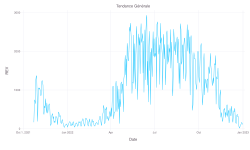

In [511]:
plot(data, x=:Date, y=:REV, Geom.line, Guide.title("Tendance Générale"))

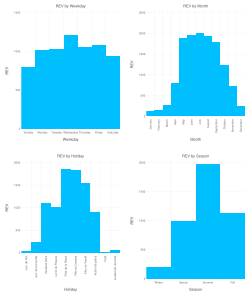

In [512]:
df_weekday = hcat(select(data, [:Date, :REV]), Dates.dayofweek.(data[:, :Date]))
rename!(df_weekday, [:Date, :REV, :Weekday])

weekday_mapping = Dict(
    1 => "Monday", 
    2 => "Tuesday", 
    3 => "Wednesday", 
    4 => "Thursday", 
    5 => "Friday", 
    6 => "Saturday", 
    7 => "Sunday")
transform!(df_weekday, :Weekday => ByRow(x -> weekday_mapping[x]) => :Weekday)

df_month = hcat(select(data, [:Date, :REV]), Dates.month.(data[:, :Date]))
rename!(df_month, [:Date, :REV, :Month])
month_mapping = Dict(
    1 => "January", 
    2 => "February", 
    3 => "March", 
    4 => "April", 
    5 => "May", 
    6 => "June", 
    7 => "July", 
    8 => "August", 
    9 => "September", 
    10 => "October", 
    11 => "November", 
    12 => "December")
transform!(df_month, :Month => ByRow(x -> month_mapping[x]) => :Month)

holiday_selector = BitVector(zeros(length(data[:, :Date])))
for i in 1:length(data[:, :Date])
    holiday_selector[i] = any(holidays[:, :Date] .== data[i, :Date])
end

df_holidays = hcat(holidays, data[holiday_selector, :REV])
rename!(df_holidays, [:Date, :Holiday, :REV])

function get_season(date)
    month = Dates.month(date)
    if month in [12, 1, 2]
        return "Winter"
    elseif month in [3, 4, 5]
        return "Spring"
    elseif month in [6, 7, 8]
        return "Summer"
    else
        return "Fall"
    end
end

df_season = hcat(select(data, [:Date, :REV]), get_season.(data[:, :Date]))
rename!(df_season, [:Date, :REV, :Season])

df_season = combine(groupby(df_season, :Season), :REV => mean => :REV)
df_holidays = combine(groupby(df_holidays, :Holiday), :REV => mean => :REV)
df_month = combine(groupby(df_month, :Month), :REV => mean => :REV)
df_weekday = combine(groupby(df_weekday, :Weekday), :REV => mean => :REV)

set_default_plot_size(25cm, 30cm)
fig_weekday = plot(df_weekday[[2, 3, 4, 5, 6, 7, 1], :], x=:Weekday, y=:REV, Geom.bar, Guide.title("REV by Weekday"))
fig_month = plot(df_month[[4, 5, 6, 7, 8, 9, 10, 11, 12, 1, 2, 3], :], x=:Month, y=:REV, Geom.bar, Guide.title("REV by Month"))
fig_holidays = plot(df_holidays[[3, 4, 5, 6, 7, 8, 9, 10, 1, 2], :], x=:Holiday, y=:REV, Geom.bar, Guide.title("REV by Holiday"))
fig_season = plot(df_season[[2, 3, 4, 1], :], x=:Season, y=:REV, Geom.bar, Guide.title("REV by Season"))
gridstack([fig_weekday fig_month; fig_holidays fig_season])



#### Conclusion sur les tendances générales dans le temps

Nous pouvons voir que c'est à peu près à quoi on s'attend des cyclistes durant différentes périodes de l'année.
Nous avons plus de cycliste en été avec une augmentation graduelle au printemp et une diminution graduelle en automne.
Les jours fériers ne semblent pas dévier de ce à quoi on s'attend dans le mois où ils se trouvent et ils ne semblent pas avoir un impact significatif. Les jours de la semaine on aussi plus de passages que les jours de la fin de semaine, cela peut être causé par les cyclistes qui se rendent au travail en vélo.

### 2.2 La température

Nous pouvons initialement commencez par créer des graphes pertinents selon notre intuition de quels données vont affectez le plus les passages. Comme la relation entre la température maximum et le nombre de passages (REV), celle minimum et le REV et celle moyenne et le REV.

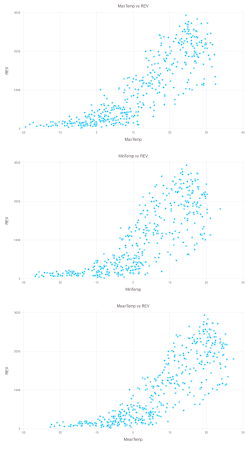

In [513]:
df1 = DataFrame(x=data[:, :MaxTemp], y=data[:, :REV], Legend="MaxTemp")
df2 = DataFrame(x=data[:, :MinTemp], y=data[:, :REV], Legend="MinTemp")
df3 = DataFrame(x=data[:, :MeanTemp], y=data[:, :REV], Legend="MeanTemp")

set_default_plot_size(25cm, 45cm)
fig1 = plot(df1, x=:x, y=:y, Geom.point, 
        Guide.xlabel("MaxTemp"), Guide.ylabel("REV"), Guide.title("MaxTemp vs REV"))
fig2 = plot(df2, x=:x, y=:y, Geom.point, 
        Guide.xlabel("MinTemp"), Guide.ylabel("REV"), Guide.title("MinTemp vs REV"))
fig3 = plot(df3, x=:x, y=:y, 
        Geom.point, Guide.xlabel("MeanTemp"), Guide.ylabel("REV"), Guide.title("MeanTemp vs REV"))

vstack(fig1, fig2, fig3)

En combinant les trois graphes nous pouvons avoir une représentation utile des données.

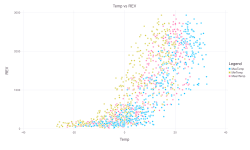

In [514]:
df = vcat(df1, df2, df3)

set_default_plot_size(25cm, 15cm)
plot(df, x=:x, y=:y, color=:Legend, Geom.point, 
    Guide.xlabel("Temp"), Guide.ylabel("REV"), Guide.title("Temp vs REV"),
    Theme(point_size=0.75mm))


#### Conclusion sur la température

Nous voyons que la température à un impact prédictif sur le nombre de passages. Le nombre de passage augmente avec la température, la relation à première vu d'oeil semble être exponentielle. Remarquons aussi qu'il y a moins de variabilité lorsque les température sont basses (soit en dessous de 0) mais elle semble croître linéairement.

### 2.3 Les précipitations


In [515]:
df = data[:, [:TotalSnow, :TotalRain, :REV]]

# removing days where it only snowed
rdf = df[(!).((df[!, :TotalRain] .== 0) .& (df[!, :TotalSnow] .> 0)), [:TotalRain, :REV]]

rdf[(rdf[!, :TotalRain] .> 0) .& (rdf[!, :TotalRain] .<= 2), :TotalRain] .= 1
rdf[(rdf[!, :TotalRain] .> 2) .& (rdf[!, :TotalRain] .<= 6), :TotalRain] .= 2
rdf[(rdf[!, :TotalRain] .> 6) .& (rdf[!, :TotalRain] .<= 10), :TotalRain] .= 3
rdf[(rdf[!, :TotalRain] .> 10) .& (rdf[!, :TotalRain] .<= 20), :TotalRain] .= 4
rdf[(rdf[!, :TotalRain] .> 20), :TotalRain] .= 5

rdf[!, :TotalRain] = string.(rdf[!, :TotalRain])
rdf[rdf.TotalRain .== "0.0", :TotalRain] .= "0mm"
rdf[rdf.TotalRain .== "1.0", :TotalRain] .= "<2mm"
rdf[rdf.TotalRain .== "2.0", :TotalRain] .= "2-6mm"
rdf[rdf.TotalRain .== "3.0", :TotalRain] .= "6-10mm"
rdf[rdf.TotalRain .== "4.0", :TotalRain] .= "10-20mm"
rdf[rdf.TotalRain .== "5.0", :TotalRain] .= "20-50mm"

rdf = combine(groupby(rdf, :TotalRain), :REV => mean => :REV_mean)


plot(rdf[[1, 2, 6, 3, 4, 5], :], x=:TotalRain, y=:REV_mean, Geom.bar, 
    Guide.xlabel("TotalRain"), Guide.ylabel("REV"), Guide.title("TotalRain vs REV"))

In [516]:
df = data[:, [:MeanTemp, :TotalRain, :TotalSnow, :REV]]
dropmissing!(df, :MeanTemp)
# removing days where it's not snowing and it's not cold and removing days where it snows and rains
rdf = df[(!).(((df[!, :MeanTemp] .> 0) .& 
            (df[!, :TotalSnow] .== 0)) .|| 
            (df[!, :TotalRain]) .> 0), [:TotalSnow, :REV]]

rdf[(rdf[!, :TotalSnow] .> 0) .& (rdf[!, :TotalSnow] .<= 2), :TotalSnow] .= 1
rdf[(rdf[!, :TotalSnow] .> 2) .& (rdf[!, :TotalSnow] .<= 6), :TotalSnow] .= 2
rdf[(rdf[!, :TotalSnow] .> 6) .& (rdf[!, :TotalSnow] .<= 10), :TotalSnow] .= 3
rdf[(rdf[!, :TotalSnow] .> 10) .& (rdf[!, :TotalSnow] .<= 20), :TotalSnow] .= 4

rdf[!, :TotalSnow] = string.(rdf[!, :TotalSnow])
rdf[rdf.TotalSnow .== "0.0", :TotalSnow] .= "0cm"
rdf[rdf.TotalSnow .== "1.0", :TotalSnow] .= "<2cm"
rdf[rdf.TotalSnow .== "2.0", :TotalSnow] .= "2-6cm"
rdf[rdf.TotalSnow .== "3.0", :TotalSnow] .= "6-10cm"
rdf[rdf.TotalSnow .== "4.0", :TotalSnow] .= "10-20cm"

rdf = combine(groupby(rdf, :TotalSnow), :REV => mean => :REV_mean)

plot(rdf, x=:TotalSnow, y=:REV_mean, Geom.bar, 
    Guide.xlabel("TotalSnow"), Guide.ylabel("REV_mean"), Guide.title("TotalSnow vs REV"))